# Importing libraries & data loading

In [1]:
import pandas as pd
import  torch
import numpy as np
import torch.nn as nn
import torchvision
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')

In [2]:
rs = 34

In [3]:

# reading csv files


cols = ["poisonous?", "cap-shape", "cap-surface", "cap-color", "bruises?", "odor", "gill-attachment",
        "gill-spacing", "gill-size", "gill-color", "stalk-shape", "stalk-root",
        "stalk-surface-above-ring", "stalk-surface-below-ring", "stalk-color-above-ring",
        "stalk-color-below-ring", "veil-type", "veil-color", "ring-number", "ring-type",
        "spore-print-color", "population", "habita"]

data =  pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/mushroom/agaricus-lepiota.data", header=None)
print(data)

     0  1  2  3  4  5  6  7  8  9   ... 13 14 15 16 17 18 19 20 21 22
0     p  x  s  n  t  p  f  c  n  k  ...  s  w  w  p  w  o  p  k  s  u
1     e  x  s  y  t  a  f  c  b  k  ...  s  w  w  p  w  o  p  n  n  g
2     e  b  s  w  t  l  f  c  b  n  ...  s  w  w  p  w  o  p  n  n  m
3     p  x  y  w  t  p  f  c  n  n  ...  s  w  w  p  w  o  p  k  s  u
4     e  x  s  g  f  n  f  w  b  k  ...  s  w  w  p  w  o  e  n  a  g
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
8119  e  k  s  n  f  n  a  c  b  y  ...  s  o  o  p  o  o  p  b  c  l
8120  e  x  s  n  f  n  a  c  b  y  ...  s  o  o  p  n  o  p  b  v  l
8121  e  f  s  n  f  n  a  c  b  n  ...  s  o  o  p  o  o  p  b  c  l
8122  p  k  y  n  f  y  f  c  n  b  ...  k  w  w  p  w  o  e  w  v  l
8123  e  x  s  n  f  n  a  c  b  y  ...  s  o  o  p  o  o  p  o  c  l

[8124 rows x 23 columns]


In [4]:
data.columns=cols

# Particle Swarm optimization: general info

The particle swarm optimization (PSO) algorithm is a metaheuristic algorithm that based on the simulation of the social behavior of birds within a flock. \\ 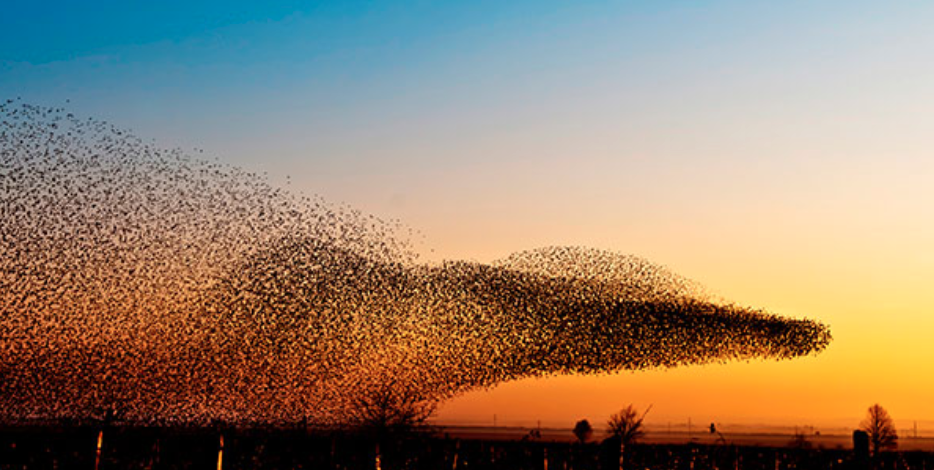

The PSO is population-based, so first we must generate a population called swarm consisting of individual particles. Each particle is moving through high-dimensional search space guided by their personal best-known position in the search-space as well as the entire swarm's best-known position. Also each particle has its own velocity.

![from Wikipedia](https://upload.wikimedia.org/wikipedia/commons/e/ec/ParticleSwarmArrowsAnimation.gif)

The algorithm is defined as following:

1. Create a ‘population’ of agents (particles) which is uniformly distributed over X.

2. Evaluate each particle’s position considering the objective function.

3. If a particle’s present position is better than its previous best position, update it.

4. Find a particle with the best position.

5. Update particles’ velocities. The formula is:

6. Move particles to their new positions:
  - Pick random numbers: rp, rg ~ U(0,1)
  - Update the particle's velocity:
    \
    $V^{t+1} = WV^t  + c_1r_p (P_b^t - P^t) + c_2r_g (g_b^t - P^t)$
    - here is:
      - W: Inertia weight,
      - c1: cognitive constant,
      - c2: social constant,
      - P: Position of the particle,
      - Pb: Personal Best,
      - gb: global Best

7. Go to step 2 until the stopping criteria are satisfied.


$V^{t+1} = WV^t  + c_1r_p (P_b^t - P^t) + c_2r_g (g_b^t - P^t)$

We'll train a neural network with one hidden layer

# Preprocessing

In [5]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,1:], data.iloc[:,0], test_size=0.15, random_state=rs)
for x in cols[1:]:
  le = preprocessing.LabelEncoder()
  X_train[x] = le.fit_transform(X_train[x])

  X_test[x] = le.transform(X_test[x])


le = preprocessing.LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=cols[1:])
X_test = pd.DataFrame(scaler.transform(X_test), columns=cols[1:])


X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=rs)

# Basic fully-connected with PyTorch

In [ ]:
batch_size = 32

train_target = torch.tensor(y_train.astype(np.long))
train = torch.tensor(X_train.values.astype(np.float32))
train_tensor = torch.utils.data.TensorDataset(train, train_target)

val_target = torch.tensor(y_val.astype(np.long))
val = torch.tensor(X_val.values.astype(np.float32))
val_tensor = torch.utils.data.TensorDataset(val, val_target)


test_target = torch.tensor(y_test.astype(np.long))
test = torch.tensor(X_test.values.astype(np.float32))
test_tensor = torch.utils.data.TensorDataset(test, test_target)



loaders ={
    'train':torch.utils.data.DataLoader(train_tensor,batch_size,shuffle=True),
    'valid':torch.utils.data.DataLoader(val_tensor,batch_size,shuffle=True),
    'test': torch.utils.data.DataLoader(test_tensor,batch_size,shuffle=True)
}

In [ ]:
from tqdm.auto import tqdm
import datetime

# Creating the function for training
def train(model, loaders, optimizer, criterion, save_path, scheduler, n_epochs=15):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    print("a")
    valid_loss_min = np.Inf
    trainingloss = []
    validationloss = []
    i = 0

    for epoch in range(1, n_epochs+1):
        #model.to(device)
        progress_bar = tqdm(range(int(len(y_train)/ batch_size)))
        print("epoch: {}".format(epoch))
        # initialize the variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        train_acc = 0.0
        val_acc = 0.0
        total_acc_val = 0.0

        ###################
        # training the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            optimizer.zero_grad()
            #data = data.to(device, dtype=torch.float)
            #target = target.to(device, dtype=torch.long)
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            progress_bar.update(1)


        ######################
        # validating the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            #data = data.to(device, dtype=torch.float)
            #target = target.to(device, dtype=torch.long)
            output = model(data)
            loss = criterion(output, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            acc = (output.argmax(dim=1) == target).sum().item()
            total_acc_val += acc

        train_loss = train_loss/len(y_train)
        valid_loss = valid_loss/len(y_val)

        accuracy = total_acc_val/len(y_val)

        scheduler.step(valid_loss)

        ## saving the model if validation loss has decreased
        if valid_loss < valid_loss_min:
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss


        trainingloss.append(train_loss)
        validationloss.append(valid_loss)

        # printing training/validation statistics
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch,
            train_loss,
            valid_loss
            ))
        print('Epoch: {} \tT Validation Accuracy: {:.6f}'.format(
            epoch,
            accuracy
            ))

    # return trained model
    return model, trainingloss, validationloss

In [ ]:
def test(loaders, model, criterion):

    # monitoring test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.
    preds = []
    targets = []

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        #data = data.to(device, dtype=torch.float)
        #target = target.to(device, dtype=torch.long)
        # forward pass
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # updating average test loss
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # converting the output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        preds.append(pred)
        targets.append(target)
        # compare predictions
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)

    return preds, targets

In [ ]:
from sklearn import metrics
def info_classif(tar, pred):
  acc = metrics.accuracy_score(tar, pred)
  cm = metrics.confusion_matrix(tar, pred)
  print("Accuracy:{}\nConfusion Matrix:\n{}\n".format(acc, cm))

In [ ]:
base_fc = nn.Sequential(
    nn.Linear(22, 64),
    nn.ReLU(),
    nn.Linear(64, 128),
    nn.ReLU(),
    nn.Linear(128, 2))

In [ ]:
n_epochs=30
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(base_fc.parameters(), lr=0.0001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
base_fc, t, v= train(base_fc, loaders, optimizer, criterion, "base_fc.pt", scheduler)

a


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 1
Epoch: 1 	Training Loss: 0.000090 	Validation Loss: 0.000611
Epoch: 1 	T Validation Accuracy: 0.884226


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 2
Epoch: 2 	Training Loss: 0.000047 	Validation Loss: 0.000335
Epoch: 2 	T Validation Accuracy: 0.901592


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 3
Epoch: 3 	Training Loss: 0.000029 	Validation Loss: 0.000240
Epoch: 3 	T Validation Accuracy: 0.946454


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 4
Epoch: 4 	Training Loss: 0.000022 	Validation Loss: 0.000188
Epoch: 4 	T Validation Accuracy: 0.958032


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 5
Epoch: 5 	Training Loss: 0.000018 	Validation Loss: 0.000152
Epoch: 5 	T Validation Accuracy: 0.965268


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 6
Epoch: 6 	Training Loss: 0.000014 	Validation Loss: 0.000119
Epoch: 6 	T Validation Accuracy: 0.975398


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 7
Epoch: 7 	Training Loss: 0.000010 	Validation Loss: 0.000095
Epoch: 7 	T Validation Accuracy: 0.976845


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 8
Epoch: 8 	Training Loss: 0.000008 	Validation Loss: 0.000073
Epoch: 8 	T Validation Accuracy: 0.984081


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 9
Epoch: 9 	Training Loss: 0.000006 	Validation Loss: 0.000056
Epoch: 9 	T Validation Accuracy: 0.991317


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 10
Epoch: 10 	Training Loss: 0.000004 	Validation Loss: 0.000042
Epoch: 10 	T Validation Accuracy: 0.991317


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 11
Epoch: 11 	Training Loss: 0.000003 	Validation Loss: 0.000036
Epoch: 11 	T Validation Accuracy: 0.992764


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 12
Epoch: 12 	Training Loss: 0.000002 	Validation Loss: 0.000028
Epoch: 12 	T Validation Accuracy: 0.995658


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 13
Epoch: 13 	Training Loss: 0.000002 	Validation Loss: 0.000022
Epoch: 13 	T Validation Accuracy: 0.995658


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 14
Epoch: 14 	Training Loss: 0.000002 	Validation Loss: 0.000018
Epoch: 14 	T Validation Accuracy: 0.995658


  0%|          | 0/194 [00:00<?, ?it/s]

epoch: 15
Epoch: 15 	Training Loss: 0.000001 	Validation Loss: 0.000016
Epoch: 15 	T Validation Accuracy: 0.995658


In [ ]:
preds, targets = test(loaders, base_fc, criterion)
preds2, targets2 = [],[]

for i in preds:
  for j in range(len(i)):
    preds2.append(i.cpu().numpy()[j])
for i in targets:
  for j in range(len(i)):
    targets2.append(i.cpu().numpy()[j])

info_classif(targets2, preds2)

Accuracy:0.9975389663658737
Confusion Matrix:
[[632   0]
 [  3 584]]



# One-layer network with particle swarm optimization

We'll write the forward propagation from scratch (see `forward_prop(params)`), we'll propagate for the whole swarm and calculate the loss (see `f(x)`) and parse the loss to the PSO instance from the pyswarms library. We'll repeat all this for 150 epochs with a swarm that contains 100 particles and predict for the test set.

The code is based on tutorial from pyswarms library.

In [ ]:
!pip install pyswarms

In [7]:
n_inputs = 22
n_hidden = 16
n_classes = 2
# Forward propagation

def ReLU(x):
    return x * (x > 0)

def forward_prop(params):
    # Roll-back the weights and biases
    W1 = params[0:352].reshape((n_inputs,n_hidden))
    b1 = params[352:368].reshape((n_hidden,))
    W2 = params[368:400].reshape((n_hidden,n_classes))
    b2 = params[400:402].reshape((n_classes,))

    # Perform forward propagation
    z1 = X_train.dot(W1) + b1  # Pre-activation in Layer 1
    a1 = np.tanh(z1)     # Activation in Layer 1
    z2 = a1.dot(W2) + b2 # Pre-activation in Layer 2
    logits = z2


    # Compute for the softmax of the logits
    exp_scores = np.array(np.exp(logits))
    probs = exp_scores / np.sum(exp_scores, axis=1, keepdims=True)

    # Compute for the negative log likelihood
    N = len(y_train) # Number of samples
    corect_logprobs = -np.log(probs[range(N), y_train])
    loss = np.sum(corect_logprobs) / N

    return loss

In [8]:
def f(x):
    """Higher-level method to do forward_prop in the
    whole swarm.

    Inputs
    ------
    x: numpy.ndarray of shape (n_particles, dimensions)
        The swarm that will perform the search

    Returns
    -------
    numpy.ndarray of shape (n_particles, )
        The computed loss for each particle
    """
    n_particles = x.shape[0]
    j = [forward_prop(x[i]) for i in range(n_particles)]
    return np.array(j)



In [ ]:
import pyswarms as ps
# Initialize swarm
options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}

# Call instance of PSO
dimensions = (n_inputs * n_hidden) + (n_hidden*n_classes) + n_hidden  + n_classes
optimizer = ps.single.GlobalBestPSO(n_particles=100, dimensions=dimensions, options=options)

# Perform optimization
cost, pos = optimizer.optimize(f, iters=150, verbose=3)


In [10]:
def predict(X, params):
    """
    Use the trained weights to perform class predictions.

    Inputs
    ------
    X: numpy.ndarray
        Input Iris dataset
    pos: numpy.ndarray
        Position matrix found by the swarm. Will be rolled
        into weights and biases.
    """
    # Neural network architecture
    n_inputs = 22
    n_hidden = 16
    n_classes = 2

     # Roll-back the weights and biases
    W1 = params[0:352].reshape((n_inputs,n_hidden))
    b1 = params[352:368].reshape((n_hidden,))
    W2 = params[368:400].reshape((n_hidden,n_classes))
    b2 = params[400:402].reshape((n_classes,))
    # Perform forward propagation
    z1 = X.dot(W1) + b1  # Pre-activation in Layer 1
    a1 = np.tanh(z1)     # Activation in Layer 1
    z2 = a1.dot(W2) + b2 # Pre-activation in Layer 2
    logits = z2          # Logits for Layer 2

    y_pred = logits.idxmax(axis="columns")
    return y_pred


In [11]:
print("Accuracy on test set: {}".format((predict(X_test, pos) == y_test).mean()))


Accuracy on test set: 0.9942575881870386


# Visualizing results

To visualize the results, we'll apply PCA transformation and select the first three components. We know that the PCA components are orthogonal, so we are able to visualize positions of particles in the swarm in each of the 150 epochs:

In [12]:
from sklearn import decomposition
pca = decomposition.PCA(n_components=3)
pca.fit(optimizer.pos_history[0])
history = []
for i in range(len(optimizer.pos_history)):
  history.append(pca.transform(optimizer.pos_history[i]))


2023-09-26 16:39:20,549 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


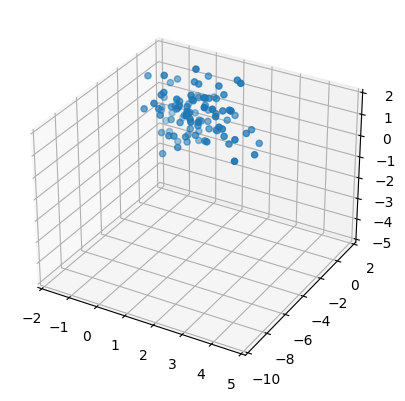

In [13]:

def update(t):
    ax.cla()
    d = pd.DataFrame(history[t])
    ax.scatter(d[0], d[1], d[2], "r")

    ax.set_xlim(-2, 5)
    ax.set_ylim(-10, 2)
    ax.set_zlim(-5, 2)


fig = plt.figure(dpi=100)
ax = fig.add_subplot(projection='3d')
ani = FuncAnimation(fig = fig, func = update, frames = 100, interval = 100)

ani

In [19]:
import matplotlib.animation as a
f = r"swarms_on_mushroom.gif"
writergif = a.PillowWriter(fps=30)
ani.save(f, writer=writergif)

2023-09-26 16:43:05,990 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>
